# Aprendizaje Automático - Trabajo Práctico
## Profesores
* Joel Spak
* Augstín Almada
* Bruno Cocitto López
## Alumnos
* Ezequiel Arévalo
* Simón Revello

In [366]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sbn
import os
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE

from config import CSV_DATA_SOURCE, LOG_LEVEL
from libs.datasets.BaseDataset import BaseDataset

In [367]:
base_dataset = BaseDataset()
base_dataset.load_csv(CSV_DATA_SOURCE)

,Unnamed: 0,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,RainfallTomorrow
0,0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,0.0
1,1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,0.0
2,2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,0.0
3,3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,1.0
4,4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145407,145454,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,...,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No,0.0
145408,145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,...,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,0.0
145409,145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,...,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,0.0
145410,145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,...,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,0.0


# Análisis Descriptivo

## Entendiendo el Dataset y los tipos de datos

In [368]:
print(base_dataset.df.info())
print("-----------------------------------")
print(base_dataset.df.describe())
print("-----------------------------------")
print(base_dataset.df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145412 entries, 0 to 145411
Data columns (total 25 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        145412 non-null  int64  
 1   Date              145412 non-null  object 
 2   Location          145412 non-null  object 
 3   MinTemp           143928 non-null  float64
 4   MaxTemp           144159 non-null  float64
 5   Rainfall          142152 non-null  float64
 6   Evaporation       82658 non-null   float64
 7   Sunshine          75616 non-null   float64
 8   WindGustDir       135096 non-null  object 
 9   WindGustSpeed     135159 non-null  float64
 10  WindDir9am        134850 non-null  object 
 11  WindDir3pm        141186 non-null  object 
 12  WindSpeed9am      143645 non-null  float64
 13  WindSpeed3pm      142351 non-null  float64
 14  Humidity9am       142759 non-null  float64
 15  Humidity3pm       140907 non-null  float64
 16  Pressure9am       13

Nos quedamos con las localidades que corresponden para el trabajo práctico e imprimimos los campos del dataset para entenderlo mejor.

In [369]:
base_dataset.df.query("Location in ('Sydney', 'SydneyAirport', 'Canberra', 'Melbourne', 'MelbourneAirport')", inplace=True)
base_dataset.df.drop("Unnamed: 0", axis=1, inplace=True)

## Valores Nulos
<p>Graficamos la dispersion de los valores nulos en un mapa de calor.</p>
<p>Detectamos que casi el 35% de nuestro dataset tiene filas con valores nulos por lo que hacer un dropna() no es una buena opcion.</p>

In [370]:

print( f"Total rows: {base_dataset.df.shape[0]} | Total nulls: {base_dataset.get_amount_of_rows_with_missing_vals()} | {base_dataset.get_percent_of_row_with_missing_vals()}% of null values ")

Total rows: 15986 | Total nulls: 5525 | 34.56149130489178% of null values 


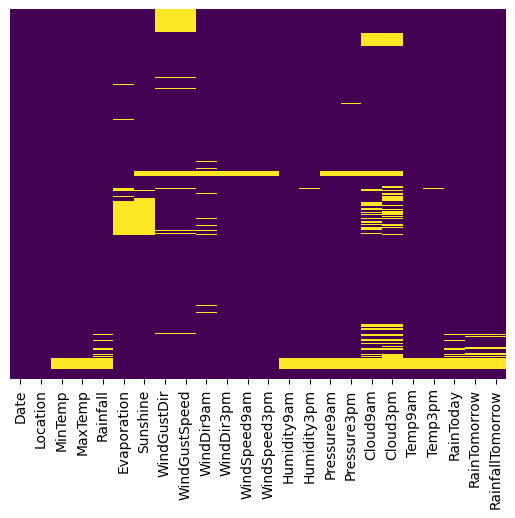

In [371]:
base_dataset.plot_nulls()

## Tratamiento de los valores nulos
---

### Graficar y entender la distribucion de las variables
---
Primero, trataremos de entender la distribucion del resto de las variables y cómo se ajustan los distintos métodos de interpolación a los datos para completar los valores nulos.



### Interpolar utilizando method='linear'
---
Considerando que los datos representan valores recolectados cronologicamente del clima para fechas consecutivas, se deberia tener un comportamiento ciclico en el valores de las variables, al menos en las de temperatura.

Se puede deducir que que la interpolacion lineal no generara un muy buen resultado para completar los valores nulos faltantes debido a que no se ajusta bien a un comportamiento ciclico.

A continuación, se muestran como se reemplazan los valores nulos en el conjunto de datos, demostrando que la interpolación 'linear' no es un metodo efectivo para interporlar este tipo de datos.

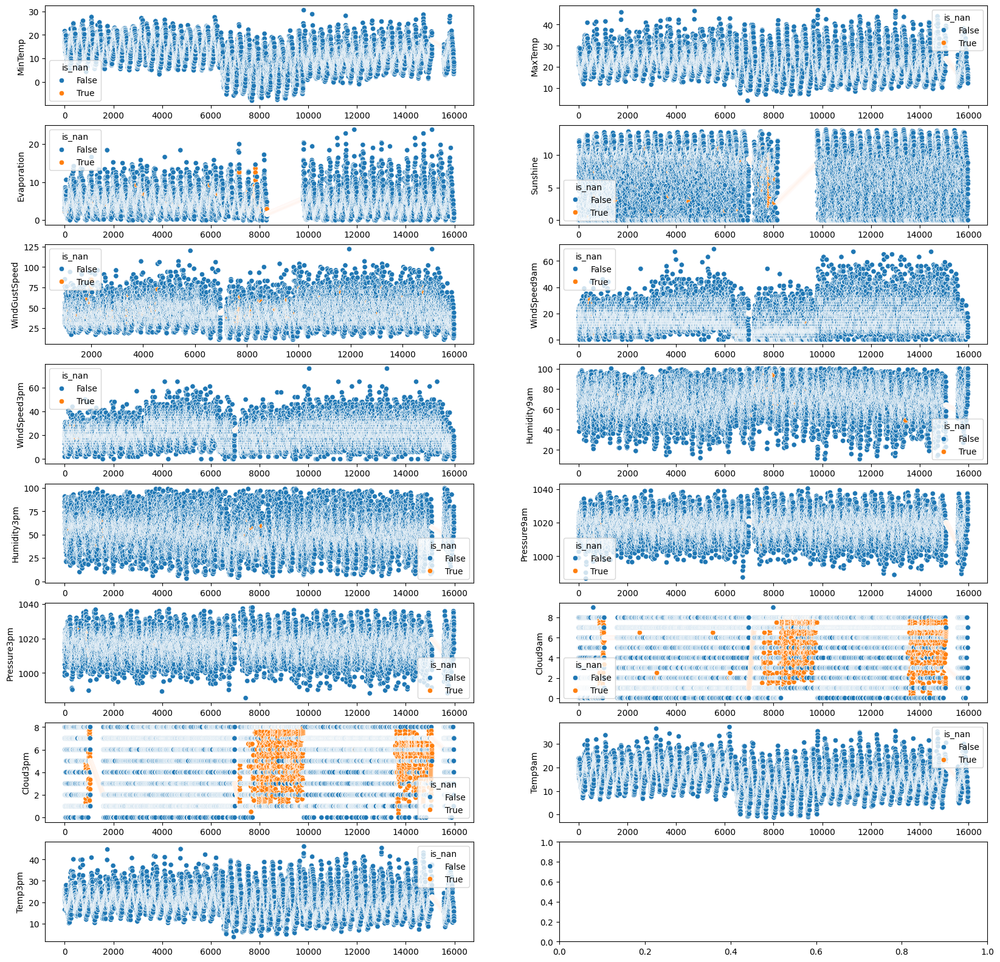

In [372]:
cols = ['MinTemp','MaxTemp','Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm' ]

cols_to_interpolate = cols.copy()

base_dataset.plot_interpolated_scatter(cols, fsize=(20,20))

## Interpolacion metodo nearest
---

Vemos que el metodo "nearest" se ajusta bien para la variables cloud9am y cloud3pm, pero no es muy efectivo para completar nulos donde la brecha entre valores consecutivos es muy grande.

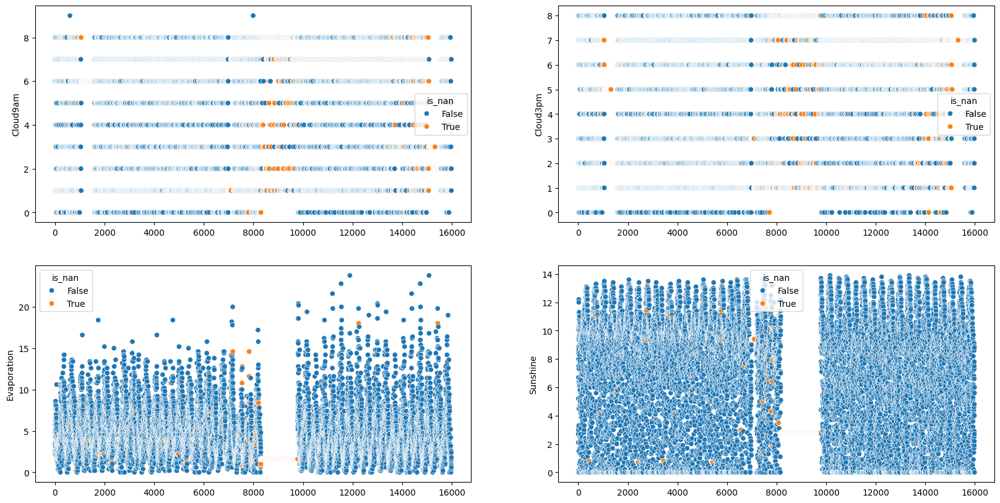

In [373]:

base_dataset.plot_interpolated_scatter(["Cloud9am", "Cloud3pm", "Evaporation","Sunshine"], method="nearest", fsize=(20,10))

<p> Interpolamos utilizanod nearest para Cloud9am y Cloud3pm </p>

Cloud9am valores nulos : 0
Cloud3pm valores nulos : 0


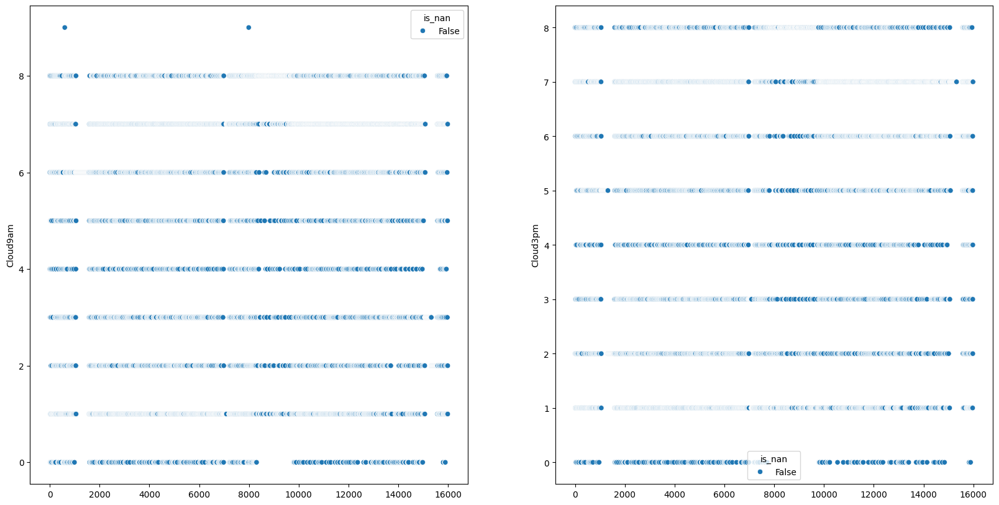

In [374]:
for col in ["Cloud9am", "Cloud3pm"]:
    base_dataset.df[col].interpolate(method="nearest", inplace=True)
    print( f"{col} valores nulos : {base_dataset.df[col].isnull().sum()}")

base_dataset.plot_interpolated_scatter(["Cloud9am", "Cloud3pm"], method="nearest", fsize=(20,10))
cols_to_interpolate = [col for col in cols_to_interpolate if col not in ["Cloud9am", "Cloud3pm"]]

## Interpolacion Polinomica
---


### Interpolar utilizando method='cubicspline'
<p>Intentamos a continuación inteporlar utilizando distintos métodos polinómicos para intentar conseguir un mejor ajuste para la interpolacion, </p>
<p>pero para grandes brechas entre datos los modelos polinómicos no se ajustan bien. </p>
<p> Por lo que interpolacion mediante metodos polinomicos es la peor opción de todas las analizadas hasta ahora, incluso intentando métodos de órden de diferente exponentes.</p>

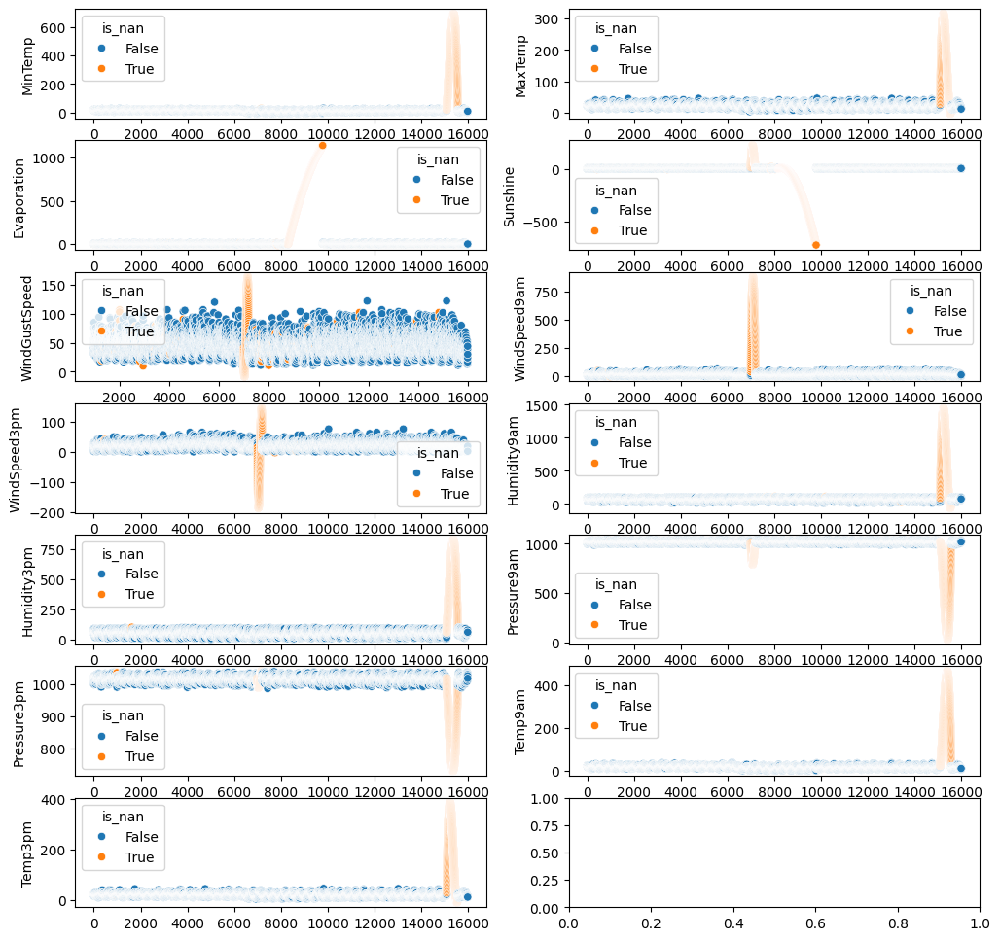

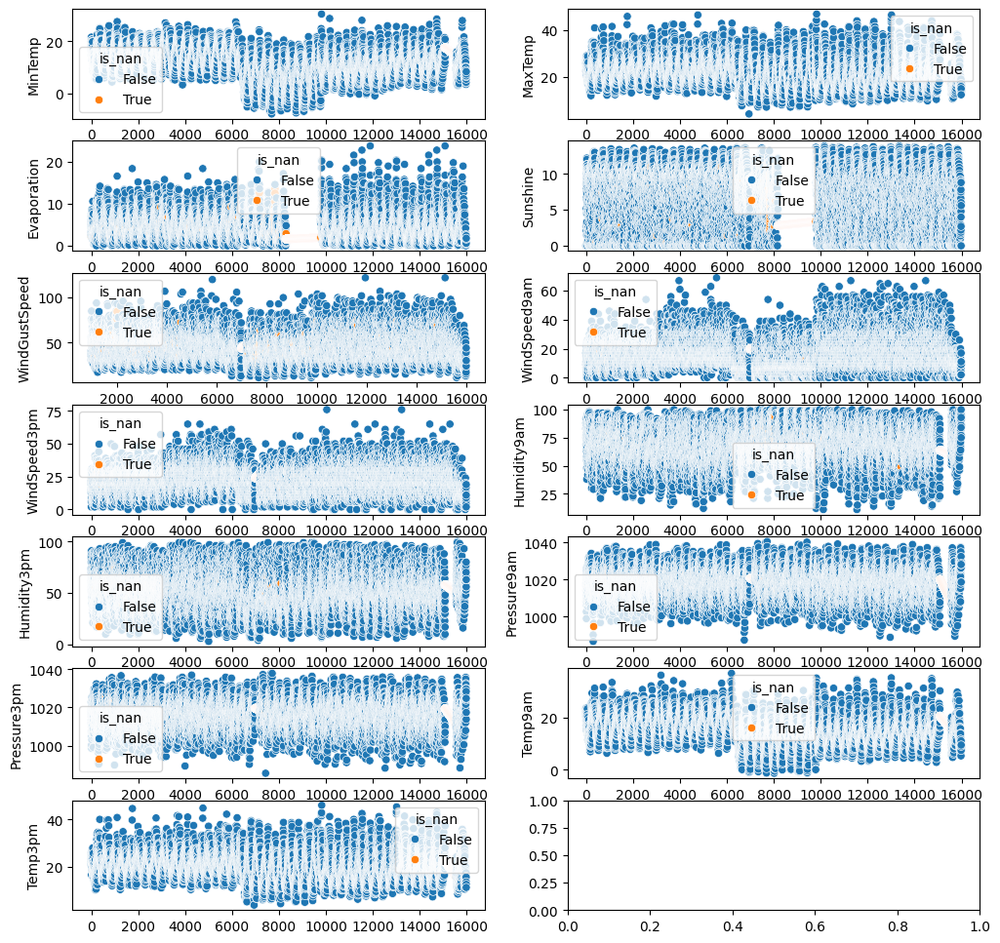

In [375]:
base_dataset.plot_interpolated_scatter(cols_to_interpolate, method="cubicspline")
base_dataset.plot_interpolated_scatter(cols_to_interpolate, method="polynomial", order=1)

Ninguno de estos metodos nos sirve para interporlar los valores sin perder demasiada informacion, por lo que vamos a intentar realizar una regresion lineal para los distintos campos para completar sus valroes.

## Regresion Lineal sobre variables explicativas
---

<p> Vamos a intentar realizar distintos modelos para poder completar los valores nulos del dataset original. </p>
<p> Para ello vamos a eliminar los valores nulos del dataset, lo que nos llevara a usar el 65% del dataset original, pero vamos a generar datos aproximados mas precisos para interpolar. </p>


### Generar encodings para variable categoricas no numericas
---


<p> Vamos a generar un nuevo dataset para usar para la interpolacion. </p>
<p> Pero primero vamos a generar el encoding de las variables en el dataset original para no repetir este proceso dos veces</p>

### Encoding de la variable Date
<p> Se consideraron de formas de realizar el encoding de la variable fecha uno generando dummy variables y la otra usando transformacion de sine/coseno.</p>
<p> Descartamos el encoding utilizando dummy variables ya que el modelo creceria mucho en tamano en termino de variables explicativas.</p>
<p> Teniendo en cuenta que estamos evaluando el clima, el cual empiricamente sabemos que posee comportamiento ciclico, se procede a utilizar los dias del ano como referencia temporal y se aplica transformacion de coseno como se detalla a continuacion.</p>


In [376]:
base_dataset.df['Date']= pd.to_datetime(base_dataset.df['Date'])
base_dataset.df['Month']= base_dataset.df['Date'].dt.month
base_dataset.df['DayOfYear']= base_dataset.df['Date'].dt.day_of_year

base_dataset.df["Month"].value_counts().sort_index()
base_dataset.df["DayOfYear"].value_counts().sort_index()

DayOfYear
1      46
2      46
3      46
4      46
5      46
       ..
362    39
363    39
364    39
365    39
366     8
Name: count, Length: 366, dtype: int64

C:\Users\ezequ\AppData\Local\Temp\ipykernel_45448\2862107064.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["month_sin"] = base_dataset.sin_transformer(12).fit_transform(df)["Month"]
C:\Users\ezequ\AppData\Local\Temp\ipykernel_45448\2862107064.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["month_cos"] = base_dataset.cos_transformer(12).fit_transform(df)["Month"]
C:\Users\ezequ\AppData\Local\Temp\ipykernel_45448\2862107064.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy 

Text(0.5, 0.98, 'Cyclical encoding with sine/cosine transformation')

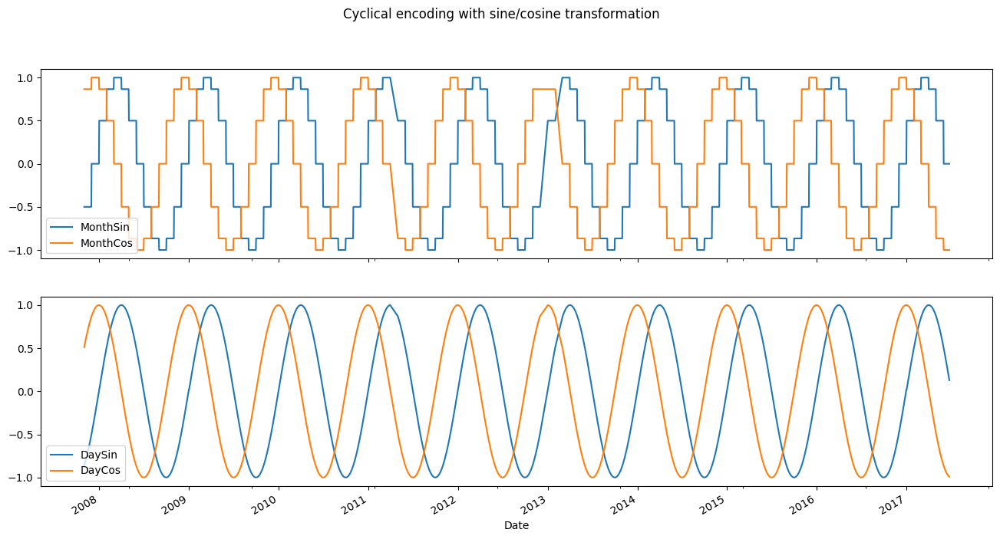

In [377]:
# Generamos un dataset temporal para poder hacer la transformación

df = base_dataset.df[["Month","DayOfYear"]]

df["month_sin"] = base_dataset.sin_transformer(12).fit_transform(df)["Month"]
df["month_cos"] = base_dataset.cos_transformer(12).fit_transform(df)["Month"]

df["day_sin"] = base_dataset.sin_transformer(365).fit_transform(df)["DayOfYear"]
df["day_cos"] = base_dataset.cos_transformer(365).fit_transform(df)["DayOfYear"]

# Añadimos las columnas al dataset original y graficamos el resultado
base_dataset.df[["MonthSin","MonthCos","DaySin","DayCos"]] = df[["month_sin","month_cos","day_sin","day_cos"]]
fig, ax = plt.subplots(2, 1, sharex=True, figsize=(16,8))
base_dataset.df[["MonthSin","MonthCos","Date"]].plot(ax=ax[0], x="Date")
base_dataset.df[["DaySin","DayCos","Date"]].plot(ax=ax[1], x="Date")
plt.suptitle("Cyclical encoding with sine/cosine transformation")

<p> Nos quedaramos con la transformacion de coseno de los dias del ano </p>

In [378]:
[ base_dataset.df.drop( col, axis=1, inplace=True) for col in ["MonthSin","MonthCos","DaySin","Month","DayOfYear", "Date"] ]


[None, None, None, None, None, None]

### Enconding para las variables explicativas

<p> Para variables Yes/No como RainToday and RainTomorrow generamos encoding binarios asignando 1 y 0 respectivamente. </p>
<p> Para variables que describen las direcciones del viento, las colapsamos en 4 valores N,S,W y E y se generaron valores dummies. </p> 
<p> Se realiza un planteo si Location deberia simplificarse y colapsar las zonas mas cercanas, pero un modelo real, por lo que se unificaran Sydney con SydneyAirport y Melbourne con MelbourneAirport.
Se generan los dummy encodings para esta categoria.</p>

In [379]:
base_dataset.df.Location.value_counts()

Location
Canberra            3435
Sydney              3343
Melbourne           3192
SydneyAirport       3008
MelbourneAirport    3008
Name: count, dtype: int64

In [380]:
base_dataset.df.Location.replace({'SydneyAirport': "Sydney", 'MelbourneAirport': "Melbourne"}, inplace=True)
print( base_dataset.df.Location.value_counts() )
one_hot_encoding=pd.get_dummies(base_dataset.df.Location, dtype=int)
print(one_hot_encoding.columns)
base_dataset.df.drop("Location", axis=1, inplace=True)
base_dataset.df = base_dataset.df.join(one_hot_encoding)


Location
Sydney       6351
Melbourne    6200
Canberra     3435
Name: count, dtype: int64
Index(['Canberra', 'Melbourne', 'Sydney'], dtype='object')


In [381]:
from sklearn.preprocessing import LabelEncoder

cardinal_points_map = {
    "N" : "^N.*$",
    "S" : "^S.*$",
    "W" : "^W.*$",
    "E" : "^E.*$"
}

for k,v in cardinal_points_map.items():
    base_dataset.df.WindGustDir.replace( to_replace=v, value=k, regex=True, inplace=True)
    base_dataset.df.WindDir3pm.replace( to_replace=v, value=k, regex=True, inplace=True)
    base_dataset.df.WindDir9am.replace( to_replace=v, value=k, regex=True, inplace=True)

one_hot_encoding=pd.get_dummies(base_dataset.df.WindGustDir, dtype=int, prefix="WindGustDir_")
base_dataset.df.drop("WindGustDir", axis=1, inplace=True)
base_dataset.df= base_dataset.df.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(base_dataset.df.WindDir9am, dtype=int,  prefix="WindDir9am_")
base_dataset.df.drop("WindDir9am", axis=1, inplace=True)
base_dataset.df = base_dataset.df.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(base_dataset.df.WindDir3pm, dtype=int,  prefix="WindDir3pm_")
base_dataset.df.drop("WindDir3pm", axis=1, inplace=True)
base_dataset.df = base_dataset.df.join(one_hot_encoding)

le = LabelEncoder()
base_dataset.df["RainToday"] = le.fit_transform(base_dataset.df.RainToday)
base_dataset.df["RainTomorrow"] = le.fit_transform(base_dataset.df.RainTomorrow)
base_dataset.df


,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindGustDir__S,WindGustDir__W,WindDir9am__E,WindDir9am__N,WindDir9am__S,WindDir9am__W,WindDir3pm__E,WindDir3pm__N,WindDir3pm__S,WindDir3pm__W
30167,19.5,22.4,15.6,6.2,0.0,NaN,17.0,20.0,92.0,84.0,...,0,0,0,0,1,0,0,0,1,0
30168,19.5,25.6,6.0,3.4,2.7,NaN,9.0,13.0,83.0,73.0,...,0,0,0,0,0,1,1,0,0,0
30169,21.6,24.5,6.6,2.4,0.1,NaN,17.0,2.0,88.0,86.0,...,0,0,1,0,0,0,1,0,0,0
30170,20.2,22.8,18.8,2.2,0.0,NaN,22.0,20.0,83.0,90.0,...,0,0,0,1,0,0,1,0,0,0
30171,19.7,25.7,77.4,NaN,0.0,NaN,11.0,6.0,88.0,74.0,...,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70366,6.4,15.8,0.0,2.4,8.8,39.0,11.0,17.0,84.0,56.0,...,0,0,0,1,0,0,0,1,0,0
70367,7.8,13.5,0.6,0.6,0.0,24.0,2.0,9.0,100.0,80.0,...,0,0,0,0,0,1,0,0,1,0
70368,6.7,14.1,0.2,0.6,0.0,24.0,9.0,11.0,93.0,56.0,...,0,0,0,1,0,0,0,1,0,0
70369,7.4,14.9,0.0,1.6,6.0,44.0,17.0,19.0,77.0,63.0,...,0,0,0,1,0,0,0,1,0,0


### Matriz de correlacion
---

<p> Generamos la matriz de correlacion para entender como se relacionan nuestro variables </p>
<p> Se utilizaran estos datos para generar los mejores datos posibles para completar los valores nulos de nuestras features </p>

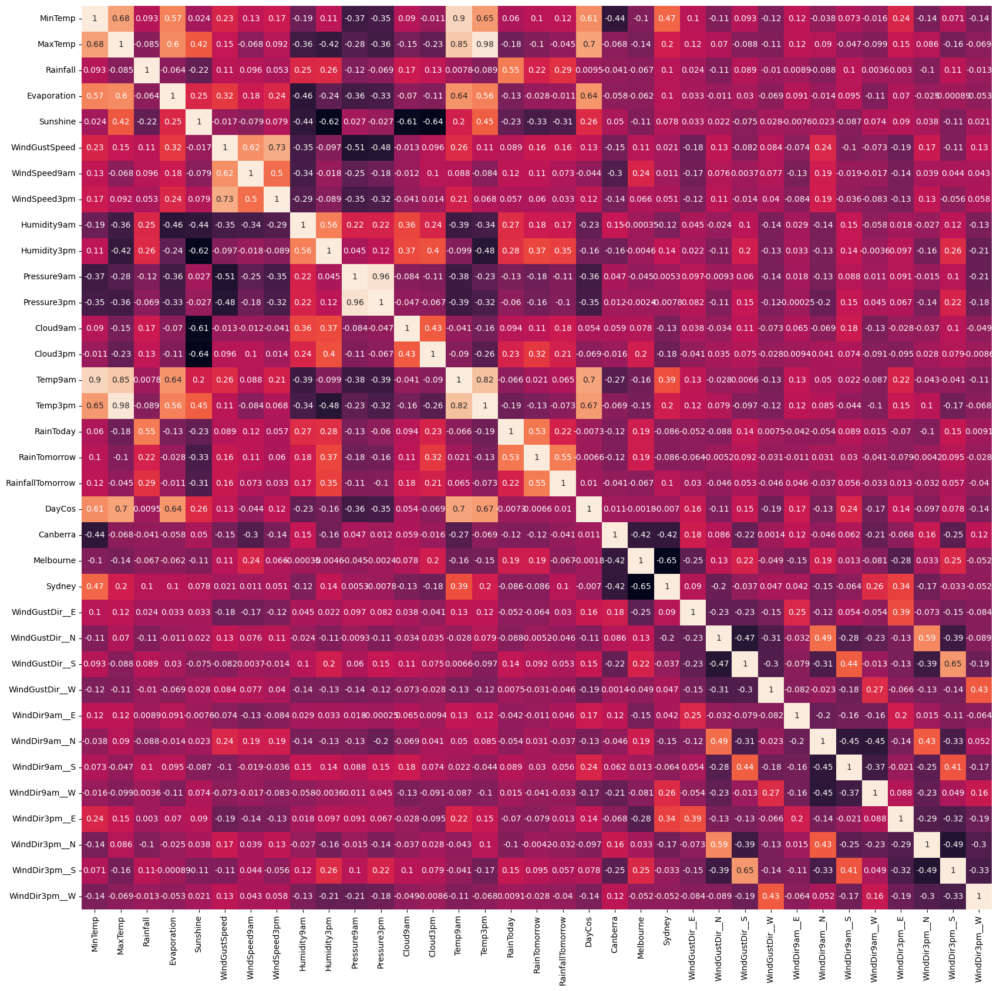

In [382]:
#base_dataset.plot_correlation()
base_dataset.df.columns
base_dataset.plot_correlation(figsize=(20,20))

### Funcion de prediccion para interpolacion de features
---

In [383]:
def predict_interpolation_values(df : pd.DataFrame, x_cols : list["str"], y_cols : list["str"]):
    results : list = []

    for y_col in y_cols:
        temp_interpolation = BaseDataset()
        temp_interpolation.df = base_dataset.df.copy()

        print( "Total nulls for evaporation : ", temp_interpolation.df[y_cols].isnull().sum())
        x_pred, x_train, x_test, y_train, y_test = temp_interpolation.split_dataset( x_train_cols=x_cols, y_train_col=y_col, test_size=0.2, shuffle_ds=False)
        model, y_pred, r2, mse = temp_interpolation.linear_regresion()
        print( "Total nulls predicted: ",len(x_pred))
        y_pred = temp_interpolation.linear_prediction(x_pred=x_pred)
        x_pred[y_col] = y_pred
        print(f"R2: {r2} | MSE: {mse}")
        results.append( (x_pred, r2, mse) )
    return results


### Variables de Temperaturas 
---
<p> Vemos que las variables de temperaturas Temp9am y Temp3pm tienen una muy fuerte correlacion MaxTem y MinTemp. </p>
<p> Por lo que se toma la decision de remover las variables MaxTemp y MinTemp para simplificar nuestro dataset.</p>
<p> Vamos a utilizar las variables <b>Evaporation, Sunshine, Pressure y Dias del ano </b> para interpolar los valores nulos de la temperatura</p>
<p> Por suerte, los rangos de valores nulos para estas variables que estan correlacionadas entre si, no se solapan. Por ejemplo podemos usar valores reales
de temperatura para predecir sunshine y viciversa. </p>

In [384]:
#base_dataset.df.drop("MaxTemp", axis=1, inplace=True)
#base_dataset.df.drop("MinTemp", axis=1, inplace=True)

<p> Creamos un dataset temporal nuevo para poder los valores sin afectar el dataset original </p>

### Variable  Sunshine
---
<p> Usaremos las variables correlacionadas para interpolar utilizando un modelo lineal para interpolar los datos </p>
<p> Vemos que un R2 de 0.7 generamos muchos mejores resultados que utilizando metodos de interpolacion provistos por pandas </p>

In [385]:
temp_interpolation_cols_x = ["Temp3pm", "Cloud9am", "Cloud3pm","Humidity9am","Humidity3pm","DayCos"]
temp_interpolation_cols_y = ["Sunshine"]

x_pred, r2, mse = predict_interpolation_values(base_dataset.df, temp_interpolation_cols_x, temp_interpolation_cols_y)[0]
    

Total nulls for evaporation :  Sunshine    1948
dtype: int64
Total nulls predicted:  1928
R2: 0.7059104097749203 | MSE: 4.379993402730087


<p> Actulizamos el dataframe original con los datos predichos y graficamos la interpolacion para asegurarnos de que se ajusto bien a los datos obtenidos </p>
<p> Graficamos para comparar las diferencia entre interpolar usando pandas y utilizando el modelo lineal generado </p>

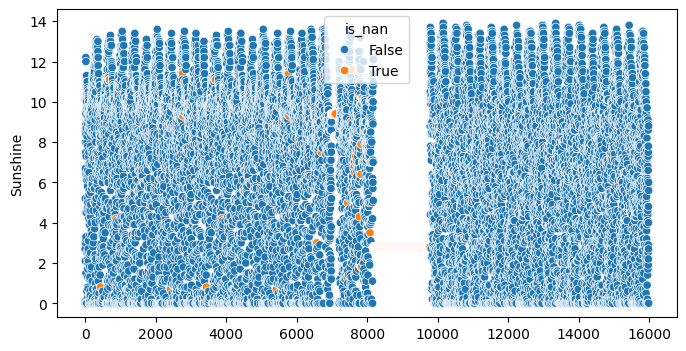

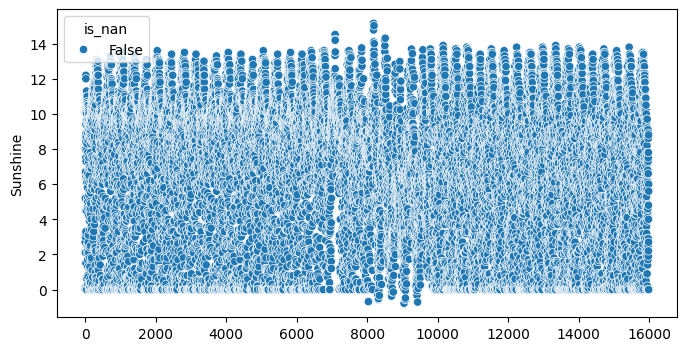

In [386]:
base_dataset.plot_interpolated_scatter(["Sunshine"], method="nearest", sy=1, fsize=(8,4))
base_dataset.df.update(x_pred["Sunshine"], errors="raise")
base_dataset.df["Sunshine"].isnull().sum()
base_dataset.df["Sunshine"].interpolate(method="nearest", inplace=True)
base_dataset.plot_interpolated_scatter(["Sunshine"],sy=1, fsize=(8,4))


<p> Notamos que todavia quedan algunos valores nulos, por lo que procedemos ahora si a interpolarlos con el metodo "nearest" ya que no existen brechas grandes entre los datos.</p>
<p> Vemos ademas que le regresion lineal genero algunos valores menores a 0 y mayores al maximo del dataset original, por lo que procedemos a ajustarlos tambien </p>

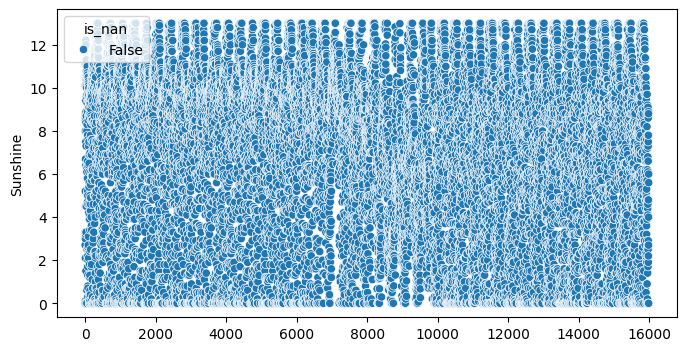

Datos nulos para la variable Sunshine: 0


In [387]:
base_dataset.df["Sunshine"] = base_dataset.df["Sunshine"].apply(lambda value: value if value >0 else 0 )
base_dataset.df["Sunshine"] = base_dataset.df["Sunshine"].apply(lambda value: value if value <=13 else 13 )
base_dataset.plot_interpolated_scatter(["Sunshine"],sy=1, fsize=(8,4))
sunshine_nulls = base_dataset.df["Sunshine"].isnull().sum()
print( f"Datos nulos para la variable Sunshine: {sunshine_nulls}")

### Interpolando Evaporation
---
<p> Siguiendo el mismo metodo utilizamos un modelo lineal para predecir datos nulos de evaporacion. </p>
<p> Utilizamos las variables Temp9am, Temp3pm, Humidity9am, DayCos, Pressure9am, Pressure3pm </p>

In [388]:
temp_interpolation_cols_x = ["Temp9am", "Temp3pm", "Humidity9am","Humidity3pm", "Pressure9am", "Pressure3pm", "DayCos"]
temp_interpolation_cols_y = ["Evaporation"]

x_pred, r2, mse = predict_interpolation_values(base_dataset.df, temp_interpolation_cols_x, temp_interpolation_cols_y)[0]


Total nulls for evaporation :  Evaporation    1706
dtype: int64
Total nulls predicted:  1684
R2: 0.5533490473596727 | MSE: 4.32048176775489


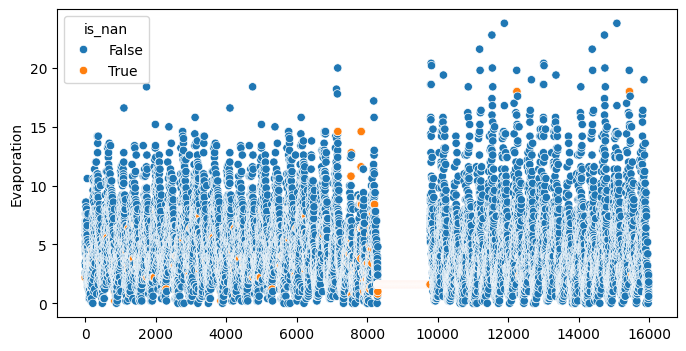

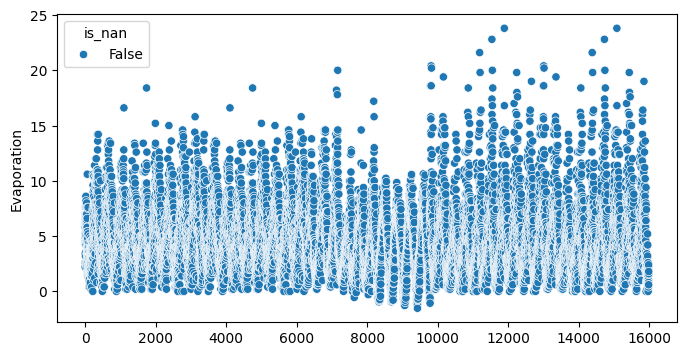

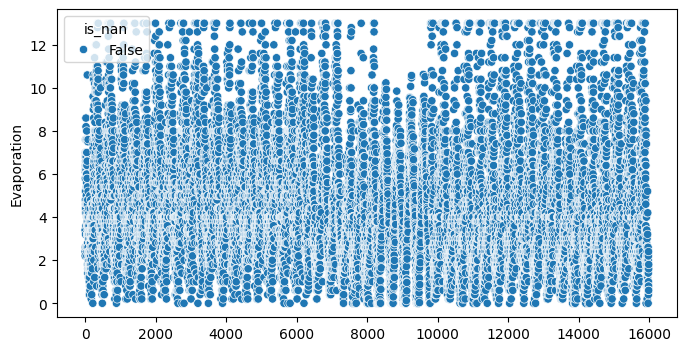

Datos nulos para la variable Evaporation: 0


In [389]:
base_dataset.plot_interpolated_scatter(["Evaporation"], method="nearest", sy=1, fsize=(8,4))
base_dataset.df.update(x_pred["Evaporation"], errors="raise")
base_dataset.df["Evaporation"].isnull().sum()
base_dataset.df["Evaporation"].interpolate(method="nearest", inplace=True)
# Evaporation tiene valores negativos predichos por el modelo, por lo que los convertimos a 0
base_dataset.df["Evaporation"] = base_dataset.df["Evaporation"].apply(lambda value: value if value >0 else 0 )
base_dataset.df["Evaporation"] = base_dataset.df["Evaporation"].apply(lambda value: value if value <=13 else 13 )
base_dataset.plot_interpolated_scatter(["Evaporation"],sy=1, fsize=(8,4))
sunshine_nulls = base_dataset.df["Evaporation"].isnull().sum()
print( f"Datos nulos para la variable Evaporation: {sunshine_nulls}")


In [391]:
temp_interpolation_cols_x = ["Evaporation", "Sunshine", "Humidity9am","Humidity3pm", "DayCos"]
temp_interpolation_cols_y = ["Temp9am", "Temp3pm"]

pred_result = predict_interpolation_values(base_dataset.df, temp_interpolation_cols_x, temp_interpolation_cols_y)


Total rows: 15986 | Total nulls: 2525 | 15.795070686850995% of null values 


<p> 

### Nota
Vemos que la interpolacion lineal no se completa exitosamente para "WindGustSpeed". Esto se debe a que la ultima row para esta columna está vacia, por lo que no puede crearse una relación entre el último dato registrado y la última row de esta columna.
<p>Graficamos nuevamente un heatmap para entender cómo quedó la distribución de valores nulos en el dataset después de la interpolación</p>

Normalizaremos los datos y crearemos una matriz de correlación para tratar de entender la importancia y el peso de las mismas.
Se puede asumir que todavia las variables que tienen valores nulos son variables explicativas importantes para el modelo.

Sunshine ( luminocidad ): probablemente muy relacionado a la evaporación, la temperatura, la nubosidad y la presión.
Evaporation ( Evaporacion): se asume que tiene las mismas relaciones fuertes al igual sunshine.
WindGustSpeed( Rafagas de viento ): Probablemente muy relacionada a la presión.

Graficaremos una matriz de correlación para ver si se puede crear un modelo de regresión para predecir la mayor cantidad de valores para estas variables.

## Normalizar variables numéricas
Normalizamos las variables numéricas ya que se encuentran todas en diferentes escalas

In [390]:
from sklearn.preprocessing import StandardScaler

categorical_vars = [ 'RainTomorrow', 'RainToday','Canberra', 'Melbourne', 'MelbourneAirport',
       'Sydney', 'SydneyAirport', 'WindGustDir__E', 'WindGustDir__N',
       'WindGustDir__S', 'WindGustDir__W', 'WindDir3pm__E', 'WindDir3pm__N',
       'WindDir3pm__S', 'WindDir3pm__W', 'WindDir9am__E', 'WindDir9am__N', 'WindDir9am__S', 'WindDir9am__W',
       'Month__1', 'Month__2', 'Month__3',
       'Month__4', 'Month__5', 'Month__6', 'Month__7', 'Month__8', 'Month__9',
       'Month__10', 'Month__11', 'Month__12', 'Season__1', 'Season__2',
       'Season__3', 'Season__4'
]

numerical_vars = [ col for col in data.columns if col not in categorical_vars ]

scale= StandardScaler() 
scaled_data = data.copy()

scaled_data[numerical_vars] = scale.fit_transform(data[numerical_vars])

NameError: name 'data' is not defined

## Matriz de correlación

In [ ]:
heatmap_data = scaled_data[numerical_vars]

plt.figure(figsize=(10, 10))
sbn.heatmap(heatmap_data.corr(numeric_only=True, method='pearson'), yticklabels=True, cbar=False, annot=True)

Concluimos que se cumple nuestra predicción anterior acerca de la correlaciones que se encuentran entre las distintas variables.
<p>Por ejemplo que Sunshine tiene una buena correlación con los dias nublados, la humedad y la temperatura.</p>
<p>Se intentera calcular los valores nulos para WindGustSpeed utilizando un modelo de regresion.</p>

In [ ]:
x_train_cols = ["MaxTemp", "Humidity9am", "Humidity3pm", "Cloud9am", "Cloud3pm","RainTomorrow"]

sunshine_data = data[ x_train_cols + ["Sunshine"] ] 
plt.figure()
sbn.heatmap(sunshine_data.corr(numeric_only=True, method='pearson'), yticklabels=True, annot=True)


Vemos que la correlación entre las variables y Sunshine siguen siendo buenas. Por lo que intentaremos predecir los valores nulos utilizando una regresión lineal.

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.metrics import confusion_matrix, classification_report

sunshine_data_null =  sunshine_data[sunshine_data["Sunshine"].isnull()]
sunshine_data_not_null = sunshine_data[sunshine_data["Sunshine"].notnull()] 

x_pred = sunshine_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(sunshine_data_not_null[x_train_cols], sunshine_data_not_null["Sunshine"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["Sunshine"] = y_pred
data["Sunshine"].update(x_pred["Sunshine"])

plot_interpolated_scatter(["Sunshine"], data, method="linear",fsize=(20,5), sy=1)

### Interpolar Sunshine con regresion lineal
Como podemos ver ahora se ajustan mucho mejor los valores para esta variable. Ahora acotaremos los valores entre 0 y 12 para mejorar los datos.

In [ ]:
data["Sunshine"] = data["Sunshine"].apply(lambda value: value if value >0 else 0 )
data["Sunshine"] = data["Sunshine"].apply(lambda value: value if value <=13 else 13 )
plot_interpolated_scatter(["Sunshine"], data, method="linear",fsize=(20,5),sy=1)

### Regresión e Interpolar Evaporation
Realizamos la creacion de un modelo de regresion lineal para predecir los valores null de Evaporation

In [ ]:
x_train_cols = [ c for c in data.columns if c != "Evaporation" ]

evaporation_data = data[ x_train_cols + ["Evaporation"] ] 
evaporation_data = evaporation_data[ 
    evaporation_data["WindGustSpeed"].notnull()
]

evaporation_data_null =  evaporation_data[evaporation_data["Evaporation"].isnull()]
evaporation_data_not_null = evaporation_data[evaporation_data["Evaporation"].notnull()] 

x_pred =evaporation_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(evaporation_data_not_null[x_train_cols], evaporation_data_not_null["Evaporation"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["Evaporation"] = y_pred
data["Evaporation"].update(x_pred["Evaporation"])
plot_interpolated_scatter(["Evaporation"], data, method="linear",fsize=(20,5), sy=1)

### Interpolamos Evaporation
<p> Se probaron varias formas de generar un modelo que se ajuste lo mejor posible para predecir los valores faltantes para la evaporación.</p>
<p> Se concluye heurísticamente que la mejor aproximacion parece ser utilizando el dataset completo. </p>
<p> Quedan algunos valores nulos que no pudieron ser interpolados y agregados al dataset pero vemos que se ajustan bien aplicando una interpolación lineal con el resto de los datos.</p>
<p> Vemos en el grafico que los datos se interpolan de forma mas prolija que todas las estimaciones anteriores usando lo metodos de interpolacion estandar provisto por la libreia Pandas. </p>
<p> Para los valores menores a 0 se restarán la distancia del minimo valor, para moverlos sobre 0 y simular un comportamiento mas parecido a la realidad </p>

In [ ]:
data["Evaporation"].interpolate(method="linear", inplace=True)
data["Evaporation"] = data["Evaporation"].apply(lambda value: 0 if value < 0 else value  )
plot_interpolated_scatter(["Evaporation"], data, method="linear",fsize=(20,5),sy=1)

# Interpolar WindGust
Se replica exactamente el mismo procedimiento que para la estimación de Evaporation y Sunshine.

In [ ]:
x_train_cols = [ c for c in data.columns if c != "WindGustSpeed" ]

windgust_data = data.copy()

windgust_data_null =  windgust_data[windgust_data["WindGustSpeed"].isnull()]
windgust_data_not_null = windgust_data[windgust_data["WindGustSpeed"].notnull()] 

x_pred = windgust_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(windgust_data_not_null[x_train_cols], windgust_data_not_null["WindGustSpeed"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["WindGustSpeed"] = y_pred
data["WindGustSpeed"].update(x_pred["WindGustSpeed"])
plot_interpolated_scatter(["WindGustSpeed"], data, method="polynomial",fsize=(20,5), sy=1, order=1)

# Escalar nuevamente los datos del dataset para toda las variables numéricas
Volvemos a escalar con nuestros datos nulos ya completos.

In [ ]:
scaled_data = data.copy()
scaled_data[numerical_vars] = scale.fit_transform(data[numerical_vars])

### Graficar la matriz de correlación final escalada sin valores nulos

In [ ]:
plt.figure(figsize=(30, 30))
sbn.heatmap(scaled_data.corr(numeric_only=True, method='pearson'), yticklabels=True, cbar=False, annot=True)

### Regresión Lineal Simple

In [ ]:
x = scaled_data.copy()
y = x["RainfallTomorrow"].copy()
x.drop("RainfallTomorrow", axis=1, inplace=True)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(x_train, y_train)
y_pred = model.predict(x_test)


r2 = r2_score( y_test, y_pred)
m_e2 = mean_squared_error( y_test, y_pred)
print (f"score R2: {round(r2, 4)}")
print (f"error MSE: {round(m_e2, 4)}") 


# Regresión Lineal sin tratamientos de los datos
Aplicaremos una regresión lineal borrando todos los datos despues de realizar el encoding de las variables y sin interpolar ningun dato.

In [ ]:
full_data_encoded.dropna(inplace=True)
full_data_encoded[numerical_vars] = scale.fit_transform(full_data_encoded[numerical_vars])

fx = full_data_encoded.copy()
fy = fx["RainfallTomorrow"].copy()
fx.drop("RainfallTomorrow", axis=1, inplace=True)
fx_train, fx_test, fy_train, fy_test = train_test_split(fx, fy, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(fx_train, fy_train)
fy_pred = model.predict(fx_test)

r2 = r2_score( fy_test, fy_pred)
m_e2 = mean_squared_error( fy_test, fy_pred)
print (f"score R2: {round(r2, 4)}")
print (f"error MSE: {round(m_e2, 4)}") 

## Conclusión Regresion Lineal
<p>Se puede ver que a pesar del esfuerzo al completar y normalizar los datos, el modelo lineal no se ajusta bien para la predicción de RainfallTomorrow con un score de 0.35. </p>
<p>Tiene mejor score y un error mas bajo al realizar un drop directamente sobre los datos nulos, por lo que seguiremos usando este set de datos en vez del interpolado.</p>

# Regularización y Regresiones Lasso, Ridge y ElasticNet 

In [ ]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, RidgeCV, ElasticNetCV, LassoCV

lr = LinearRegression()
lr.fit(fx, fy)

print("Coeficientes del modelo de regresión lineal:")
#print(lr.coef_)
print(lr.score(fx,fy))

for alpha, ratio in [(0.9,0.2), (0.6,0.5), (0.3,0.5), (0.2,0.5), (0.1,0.3),
                     (0.01,0.9), (0.001,0.7), (0.0001,0.2), (0.00001,0.5), (0.000001,0.9)]:
    lasso = Lasso(alpha=0.1)
    ridge = Ridge(alpha=0.1) 
    elasticnet = ElasticNet(alpha=alpha, l1_ratio=ratio)

    lasso.fit(fx, fy)
    ridge.fit(fx, fy)
    elasticnet.fit(fx,fy)


    print(f"\nAlpha: {alpha} Ratio {ratio}")
    #print(lasso.coef_)
    print(f"Lasso Coef: {round(lasso.score(fx,fy), 4)}")

    #print(ridge.coef_)
    print(f"Ridge Coef: {round(ridge.score(fx,fy), 4)}")

    #print(elasticnet.coef_)
    print(f"ElasticNet : {round(elasticnet.score(fx,fy), 4)}")

# Regularizacion y Regresiones Lasso, Ridge y ElasticNet Cross Validation 

In [ ]:
lassoCV = LassoCV() 
ridgeCV = RidgeCV() 
elasticnetCV = ElasticNetCV()

lassoCV.fit(fx, fy)
ridgeCV.fit(fx, fy)
elasticnetCV.fit(fx,fy)

print("lasso alpha:",lassoCV.alpha_)
print("ridge alpha:",ridgeCV.alpha_)
print("elastic net alpha:",elasticnetCV.alpha_ )

# Mostrar coeficientes
print("\nCoeficientes del modelo Lasso:")
#print(lassoCV.coef_)
print(round(lassoCV.score(fx,fy), 4))

print("\nCoeficientes del modelo Ridge:")
#print(ridgeCV.coef_)
print(round(ridgeCV.score(fx,fy), 4))


print("\nCoeficientes del modelo ElasticNet:")
#print(elasticnetCV.coef_)
print(round(elasticnetCV.score(fx,fy), 4))

## Analizar variables para clasificación
El propósito es ver qué variables nos permiten diferenciar correctamente si llueve o no.
Dado que ya realizamos un análisis previo de las variables para la regresión lineal no hay mucho análisis para agregar ya que la variable RainfallTomorrow explica la columna RainTomorrow

In [ ]:
dfclas = data.copy()

In [ ]:
cols = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday', 'RainfallTomorrow',
       'Canberra', 'Melbourne', 'MelbourneAirport', 'Sydney', 'SydneyAirport']
filas = 4
columnas = 6
plt.figure()
fig, axs = plt.subplots(filas, columnas, figsize=(18, 12))
fig.subplots_adjust(hspace=0.5)
for i, columna in enumerate(cols):
    f = i // columnas
    c = i % columnas
    sbn.kdeplot(dfclas, x=columna, hue="RainTomorrow", ax=axs[f, c])
    axs[f, c].set_title(columna)
    axs[f, c].set_xlabel('')
    axs[f, c].set_ylabel('')
plt.show()

In [ ]:
tot_no = data["RainTomorrow"].value_counts()[0]
tot_si = data["RainTomorrow"].value_counts()[1]
porcentaje_si = round(tot_si / (tot_no + tot_si) * 100, 2)
porcentaje_no = round(tot_no / (tot_no + tot_si) * 100, 2)
data_cantidad = pd.DataFrame(columns=["RainTomorrow", "%"], index=["Si", "No", "Total"], data=[
    [tot_si, porcentaje_si],
    [tot_no, porcentaje_no],
    [tot_si + tot_no, porcentaje_si + porcentaje_no]
])

plt.figure()
plt.pie([tot_si, tot_no], labels=["Si", "No"], autopct='%1.1f%%')
plt.show()

In [ ]:
data_cantidad

Podemos ver que hay una desproporción en la cantidad de casos de lluvia con los de no lluvia. Si utilizamos el dataset como actualmente está obtendremos un modelo sesgado que tendrá preferencia por los dias de no lluvia. Para esto podemos utilizar diferentes técnicas para mantener el dataset proporcionado:
* Pesos de clase: A la clase LogisticRegression podemos setear el parámetro class_weight a "balanced" para dar más peso a los registros de lluvia
* Submuestreo: Eliminar registros de no lluvia hasta equiparar los de lluvia.
* Sobremuestreo: Generar información sintética para aumetar los registros de lluvia.

## Pesos de clase

In [ ]:
logmodel = LogisticRegression(class_weight="balanced", random_state=42, max_iter=1000)

In [ ]:
dflogx = full_data_encoded.copy()
dflogy = dflogx["RainTomorrow"].copy()
dflogx.drop("RainTomorrow", axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(dflogx, dflogy, test_size=0.3, random_state=42)
logmodel.fit(X_train, y_train)

In [ ]:
y_predict = logmodel.predict(X_test)
conf_matrix = pd.DataFrame(confusion_matrix(y_test, y_predict), columns=["Negativo Predicho", "Positivo Predicho"], index=["Real Negativo", "Real Positivo"])
print(confusion_matrix(y_test, y_predict))
print(classification_report(y_test, y_predict))

In [ ]:
conf_matrix

## Submuestreo
Para el submuestreo vamos a crear una función que elimine aleatoriamente registros de una clase para así poder equilibrar el dataframe

In [ ]:
def submuestreo(df: pd.DataFrame, columna: str):
    clases = df[columna].unique()
    clases_count = df[columna].value_counts()
    #Encontrar clase con menor frecuencia
    clase_menor = clases_count.idxmin()
    #Iterar y seleccionar aleatoriamente un nro igual de muestras de cada clase
    clase_menor_count = clases_count[clase_menor]
    data_generada = pd.DataFrame(columns=df.columns)
    dataframes = []
    for clase_target in clases:
        clase_data = df[df[columna] == clase_target]
        if clase_target != clase_menor:
            dataframes.append(clase_data.sample(clase_menor_count, replace=False))
        else:
            dataframes.append(clase_data)
    data_generada = pd.concat(dataframes)
    return data_generada

In [ ]:
full_data_encoded["RainTomorrow"].value_counts()

In [ ]:
dfsub = submuestreo(full_data_encoded, "RainTomorrow")
plt.pie(dfsub["RainTomorrow"].value_counts(), labels=["Si", "No"], autopct='%1.1f%%')

In [ ]:
logmodel = LogisticRegression(random_state=42)
dflogx = dfsub.copy()
dflogy = dflogx["RainTomorrow"].copy()
dflogx.drop("RainTomorrow", axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(dflogx, dflogy, test_size=0.3, random_state=42)
logmodel.fit(X_train, y_train)

In [ ]:
y_predict = logmodel.predict(X_test)
conf_matrix = pd.DataFrame(confusion_matrix(y_test, y_predict), columns=["Negativo Predicho", "Positivo Predicho"], index=["Real Negativo", "Real Positivo"])
print(confusion_matrix(y_test, y_predict))
print(classification_report(y_test, y_predict))

In [ ]:
conf_matrix

## SMOTE
Esta librería realiza los siguientes pasos para equilibrar el dataset
1. Para cada fila de la clase minoritaria, se identifican sus k vecinos más cercanos
2. Se selecciona aleatoriamente uno de los vecinos cercanos y se lo etiqueta como *Vecino Cercano*
3. Se elige un valor aleatorio entre 0 y 1, luego multiplica la diferencia entre la instancia actual y el *Vecino Cercano* por el valor aleatorio. Este resultado se suma a la instancia actual para crear una nueva con diferentes datos

In [ ]:
dfsx = dfsub.copy()
dfsy = dfsx["RainTomorrow"].copy()
dfsx.drop("RainTomorrow", axis=1, inplace=True)
smote = SMOTE(random_state=42)
xsmote, ysmote = smote.fit_resample(dfsx, dfsy)
X_train, X_test, y_train, y_test = train_test_split(xsmote, ysmote, test_size=0.3, random_state=42)

In [ ]:
logmodel = LogisticRegression(random_state=42, max_iter=1000)
logmodel.fit(X_train, y_train)
logpredict = logmodel.predict(X_test)

In [ ]:
print(confusion_matrix(y_test, logpredict))
print(classification_report(y_test, logpredict))

In [ ]:
confusion_matrix_smote = pd.DataFrame(confusion_matrix(y_test, logpredict), columns=["Negativo Predicho", "Positivo Predicho"], index=["Real Negativo", "Real Positivo"])
confusion_matrix_smote

## Conclusión
Vemos que cualquiera de los tres métodos son útiles ya que en todos obtenemos *precision*, *recall* y *f1-score* de 0.99 y 0.98. Además, en todas las matrices de confusión podemos ver que hay muchos Negativos Positivos y Reales Positivos

## Redes neuronales con Tensorflow

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Input, Dropout
from tensorflow.keras.models import clone_model
import os
import optuna
tf.config.run_functions_eagerly(True)
tf.data.experimental.enable_debug_mode()

#### Crear modelo para clasificación (Llueve / No llueve)

In [ ]:
def objetivo_clas(trial: optuna.trial.Trial):
    num_capas = trial.suggest_int("num_layers", 1, 4)
    model = Sequential()
    for i in range(num_capas):
        num_conexiones = trial.suggest_int(f"n_units_layer_{i}", 4, 200)
        model.add(Dense(num_conexiones, activation="relu"))
    model.add(Dense(1, activation="sigmoid"))
    model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
    model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32)
    score = model.evaluate(X_test, y_test, verbose=0)
    return score[1]

Se define una función objetivo para poder encontrar los mejores hiperparámetros para el modelo. Luego, se utiliza *optuna* para maximizar la función

In [ ]:
estudio = optuna.create_study(direction="maximize")
estudio.optimize(objetivo_clas, n_trials=1)

In [ ]:
estudio.best_params

In [ ]:
estudio.best_value

Los mejores parámetros:
* num_layers: 3
* Neuronas en capa 1: 71
* Neuronas en capa 2: 16
* Neuronas en capa 3: 56
<br>
Score: 0.99

## Creación del modelo

In [ ]:
model_reg = Sequential()
model_reg.add(Input(shape=[dfsx.shape[1], ]))
model_reg.add(Dense(71, activation="relu"))
model_reg.add(Dense(16, activation="relu"))
model_reg.add(Dense(56, activation="relu"))
model_reg.add(Dense(1, activation="sigmoid"))
model_reg.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
history = model_reg.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32)

In [ ]:
model_reg.evaluate(X_test, y_test)

In [ ]:
pd.DataFrame(history.history).plot(figsize=(8, 5), xlim=[0, 9], ylim=[0, 1], grid=True, xlabel="Epoch", style=["r--", "r--.", "b-", "b-*"])
plt.show()

Se puede ver en el gráfico que, en las épocas finales, *accuracy* y *val_accuracy* están casi encima de la otra lo que indicaría que no hay un overfitting. Viendo el gráfico se puede decir que la precisión converge a uno y la pérdida a cero.

#### Creación de modelo para regresión

In [ ]:
def objetivo_reg(trial: optuna.trial.Trial):
    num_capas = trial.suggest_int("num_layers", 1, 4)
    model = Sequential()
    for i in range(num_capas):
        num_conexiones = trial.suggest_int(f"n_units_layer{i}", 4, 200)
        model.add(Dense(num_conexiones, activation="relu"))
    model.add(Dense(1))
    model.compile(optimizer="adam", loss="mean_squared_error", metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])
    model.fit(fx_train, fy_train, validation_data=(fx_test, fy_test), epochs=10, batch_size=32)
    score = model.evaluate(fx_test, fy_test, verbose=0)
    return score[1]

In [ ]:
estudio_reg = optuna.create_study(direction="maximize")
estudio_reg.optimize(objetivo_reg, n_trials=1)

In [ ]:
estudio_reg.best_params

In [ ]:
estudio_reg.best_value

Luego de haber realizado distintas pruebas utilizando optula se encontró que los mejores parámetros son:
* Número de capas: 4
* Neuronas en capa 1: 152
* Neuronas en capa 2: 143
* Neuronas en capa 3: 118
* Neuronas en capa 4: 135
<br>
Score: 0.92

#### Creación del modelo

In [ ]:
modelo_reg = Sequential()
modelo_reg.add(Input(shape=[fx_train.shape[1], ]))
modelo_reg.add(Dense(152, activation="relu"))
modelo_reg.add(Dense(143, activation="relu"))
modelo_reg.add(Dense(118, activation="relu"))
modelo_reg.add(Dense(135, activation="relu"))
modelo_reg.add(Dense(1))
modelo_reg.compile(optimizer="adam", loss="mean_squared_error", metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])
history_reg = modelo_reg.fit(fx_train, fy_train, validation_data=(fx_test, fy_test), epochs=10, batch_size=32)

In [ ]:
modelo_reg.evaluate(fx_test, fy_test)

In [ ]:
pd.DataFrame(history_reg.history).plot(figsize=(8, 5), xlim=[0, 9],  grid=True, xlabel="Epoch", style=["r--", "r--.", "b-", "b-*"])
plt.show()

Analizando el gráfico, podemos ver que la métrica RMSE de training está muy por encima del RMSE de testing y lo mismo sucede con la pérdida, por lo tanto contamos con overfitting. Además, no vemos que el modelo mejore a lo largo de las iteraciones

### SHAP - Explicabilidad de modelo

In [ ]:
import shap
shap.initjs()

#### Regresión Logística - Clasificación

In [ ]:
explainer_log = shap.Explainer(logmodel, X_train.values, feature_names=X_train.columns)
shap_log = explainer_log.shap_values(X_test.values)
shap_values_log = explainer_log(X_test.values)
index = 0
explanation_log = shap.Explanation(values=shap_log[index], base_values=explainer_log.expected_value, feature_names=X_train.columns)

### Explicación global - Modelo Regresión Logística

In [ ]:
shap.plots.beeswarm(shap_values_log)

In [ ]:
shap.plots.force(shap_values_log[0:100], feature_names=X_train.columns)

Podemos observar que la variable que más afecta en la decisión a nivel global del modelo de regresión logística es **RainfallTomorrow** lo cual tiene sentido ya que nos indica la cantidad de lluvia que cayó el día de mañana y si consideramos que nuestro modelo debe predecir si mañana llueve o no es una variable de suma importancia

### Explicación Local - Modelo Regresión Logística

In [ ]:
plt.figure()
shap.force_plot(explainer_log.expected_value, explanation_log.values, X_test.values[index], text_rotation=45, feature_names=X_train.columns, matplotlib=True)
plt.tight_layout()

En el caso de este registro en particular, podemos ver el valor de la predicción promedio (base value) y cómo cada feature fue modificando ese valor hasta llegar a f(x)

In [ ]:
shap.plots.waterfall(explanation_log)

En este gráfico de cascada podemos observar lo mismo y ver cuantitativamente los cambios que realizaron cada feature

#### Regresión Lineal - Ridge

In [ ]:
explainer_ridge = shap.LinearExplainer(ridgeCV, fx_train.values, feature_names=fx_train.columns)
shap_ridge = explainer_ridge.shap_values(fx_test.values)
shap_values_ridge = explainer_ridge(fx_test.values)
index = 0
explanation_ridge = shap.Explanation(values=shap_ridge[index], base_values=explainer_ridge.expected_value, feature_names=fx_train.columns)

### Explicación global - Modelo Regresión Lineal

In [ ]:
shap.plots.beeswarm(shap_values_ridge)

En este caso, a diferencia de la regresión logística, vemos que la influencia de las features están mas distribuidas

In [ ]:
shap.plots.force(shap_values_ridge[0:100], feature_names=fx_train.columns)

En este otro gráfico podemos corroborar lo que vimos en el anterior anterior al observar que no hay ninguna variable que opaca toda la distribución

### Explicación Local - Modelo Regresión Lineal

In [ ]:
plt.figure()
shap.force_plot(explainer_ridge.expected_value, explanation_ridge.values, fx_test.values[index], text_rotation=45, feature_names=fx_train.columns, matplotlib=True)
plt.tight_layout()

In [ ]:
shap.plots.waterfall(explanation_ridge)

En los gráficos anteriores vemos cómo influye cada feature en una predicción particular. 

## Creacion del modelo utilizando Pipelines

In [ ]:
pipeline = Pipeline([
    ("preprocessor", scale),
    ('custom_model',logmodel)
])

## Exportar Pipeline

In [ ]:
import joblib
joblib.dump(pipeline, 'models/rain.pkl')

# Conclusión
Durante este proyecto, exploramos y desarrollamos múltiples modelos para predecir la lluvia basándonos en diversas características. Comenzamos abordando la integridad de nuestros datos al completar los valores faltantes, asegurándonos de mantener la calidad de nuestro conjunto de datos para su análisis.

Para nuestros modelos de regresión, experimentamos con varios enfoques, incluyendo regresión lineal clásica, Ridge, Lasso y Elastic Net. Observamos cómo cada uno maneja la regularización y la complejidad del modelo, lo que nos permitió seleccionar el enfoque más adecuado para nuestro problema. Sin embargo, nunca logramos obtener un buen modelo de regresión.

Además, para lidiar con el desbalance en los datos, aplicamos técnicas de balanceo en nuestro conjunto de datos, lo que mejoró significativamente el rendimiento y la generalización de nuestros modelos.

Exploramos modelos más avanzados, incluyendo redes neuronales tanto para regresión como para clasificación, utilizando TensorFlow y Keras. Estos modelos demostraron una capacidad impresionante para capturar relaciones no lineales y patrones complejos en los datos, aunque requirieron una mayor complejidad de ajuste.

Analizamos los modelos con Shap para generar gráficos explicativos.

Finalmente, integramos todos nuestros modelos en una pipeline para una implementación más sencilla y usamos Streamlit para llevar nuestro proyecto a producción. Esta herramienta nos permitió crear una interfaz interactiva y amigable que ofrece nuestras predicciones a los usuarios finales.